In [ ]:
# ComputerVision_HOMEWORK_9

# In this homework I will test dlib frontal face detector with:
### picture (friends, shape=(676, 1200, 3)) with good resolution and quality. All persons stand in one line, no difference in depth.
### picture (china_leute, shape=(436, 700, 3)) has lower sizes, it is difference in depth. Faces are tilted/rotated, smiled, have rich mimic.
### picture (alumni, shape=(630, 1172, 3)) has many faces, that have low sizes, variety in depth, mimic.
### picture (profiles, shape=(1600, 1500, 3)) has profile photos of men. Despite detector called "frontal face detector", I wanted to test it anyway.

# To test robustness, I have added blurring and "salt and pepper" noise to compare num of faces, that were detected.

In [15]:
import cv2
import dlib
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
from random import randint
plt.rcParams['figure.figsize'] = [15, 10]

In [16]:
friends, china_leute, alumni, profiles = "/content/friends.jpg", "/content/China_Leute_2.jpg", "/content/random_photo_alumni.PNG", \
                                         "/content/stock-photo-composition-of-profiles-of-people-of-different-ages.jpg"
input_imgs = (friends, china_leute, alumni, profiles)
output_imgs = {_img : dict.fromkeys(('original', 'color', 'grey', 'result_dlib', 'result_dlib_blurred', 'color_blurred', 'salt_pepper_noise', \
                                     'color_rects', 'grey_rects', 'color_blurred_rects', 'salt_pepper_rects')) for _img in input_imgs}

In [17]:
# func to add salt-pepper noise to picture
def add_salt_pepper_noise(pic, probability = 0.035):
  rows, cols, _ = pic.shape
  for r in range(rows):
      for c in range(cols):
        if np.random.rand() < probability:
          # 50% chance of getting salt or pepper
          if np.random.rand() < 0.5:
            pic[r, c, :] = 255
          else:
            pic[r, c, :] = 0
  return pic

In [51]:
def hanler_of_pics():
  # Let's load the detector
  detector = dlib.get_frontal_face_detector()

  def rect_to_bb(rect):
    # Dlib rect --> OpenCV rect
    x = rect.left()
    y = rect.top()
    w = rect.right() - x
    h = rect.bottom() - y

    return (x, y, w, h)

  rect_color, rect_grey, rects, rect_color_blurred, rect_salt_pepper = 0, 0, 0, 0, 0
  
  for img in input_imgs:
    
    try:
      output_imgs.get(img).update({'original'   : cv2.imread(img)})
      output_imgs.get(img).update({'color'      : cv2.cvtColor(output_imgs.get(img).get('original'), cv2.COLOR_BGR2RGB)})
      output_imgs.get(img).update({'grey'       : cv2.cvtColor(output_imgs.get(img).get('original'), cv2.COLOR_BGR2GRAY)})
      output_imgs.get(img).update({'result_dlib': np.copy(cv2.cvtColor(output_imgs.get(img).get('original'), cv2.COLOR_BGR2RGB))})
      output_imgs.get(img).update({'color_blurred' : cv2.GaussianBlur(output_imgs.get(img).get('color'), ksize=(13,13), sigmaX=7)})
      output_imgs.get(img).update({'salt_pepper_noise'   : add_salt_pepper_noise(np.copy(output_imgs.get(img).get('color')))})

      rect_color = detector(output_imgs.get(img).get('color'), 1)
      rect_grey = detector(output_imgs.get(img).get('grey'), 1)
      rect_color_blurred = detector(output_imgs.get(img).get('color_blurred'), 1)
      rect_salt_pepper = detector(output_imgs.get(img).get('salt_pepper_noise'), 1)

      output_imgs.get(img).update({'color_rects' : rect_color, \
                                   'grey_rects' : rect_grey, \
                                   'color_blurred_rects': rect_color_blurred, \
                                   'salt_pepper_rects' : rect_salt_pepper
                                   }
                                  )

      print(f"{img}, shape={output_imgs.get(img).get('original').shape}:\nlen(rect_color)={len(rect_color)},\nlen(rect_grey)={len(rect_grey)},\n" \
            f"len(rect_color_blurred)={len(rect_color_blurred)},\nrect_salt_pepper={len(rect_salt_pepper)}\n")
      
      # max faces on color / grey pic, mark it on result_dlib
      rects = rect_color if len(rect_color) > len(rect_grey) else rect_grey
      if len(rects):
        for rect in rects:    
          # Draw rectangle around the face
          x, y, w, h = rect_to_bb(rect)
          #print(x, y, w, h)
          cv2.rectangle(output_imgs.get(img).get('result_dlib'), (x, y), (x+w, y+h), (randint(0,255), randint(0,255), randint(0,255)), 3)
      #if present mark faces on blurred photo
      if len(rect_color_blurred):
        for rect in rect_color_blurred:    
          # Draw rectangle around the face
          x, y, w, h = rect_to_bb(rect)
          #print(x, y, w, h)
          cv2.rectangle(output_imgs.get(img).get('color_blurred'), (x, y), (x+w, y+h), (randint(0,255), randint(0,255), randint(0,255)), 3)
      if len(rect_salt_pepper):
        for rect in rect_salt_pepper:    
          # Draw rectangle around the face
          x, y, w, h = rect_to_bb(rect)
          #print(x, y, w, h)
          cv2.rectangle(output_imgs.get(img).get('salt_pepper_noise'), (x, y), (x+w, y+h), (randint(0,255), randint(0,255), randint(0,255)), 3)
    except Exception as ex:
      print(f'Some problems with {img} image')
      print(ex)

In [31]:
hanler_of_pics()

/content/friends.jpg, shape=(676, 1200, 3):
len(rect_color)=6,
len(rect_grey)=6,
len(rect_color_blurred)=6,
rect_salt_pepper=6

/content/China_Leute_2.jpg, shape=(436, 700, 3):
len(rect_color)=6,
len(rect_grey)=6,
len(rect_color_blurred)=1,
rect_salt_pepper=4

/content/random_photo_alumni.PNG, shape=(630, 1172, 3):
len(rect_color)=20,
len(rect_grey)=17,
len(rect_color_blurred)=0,
rect_salt_pepper=10

/content/stock-photo-composition-of-profiles-of-people-of-different-ages.jpg, shape=(1600, 1500, 3):
len(rect_color)=6,
len(rect_grey)=6,
len(rect_color_blurred)=2,
rect_salt_pepper=3



In [ ]:
# Note: only "alumni" grey version photo has lower number of detected faces.

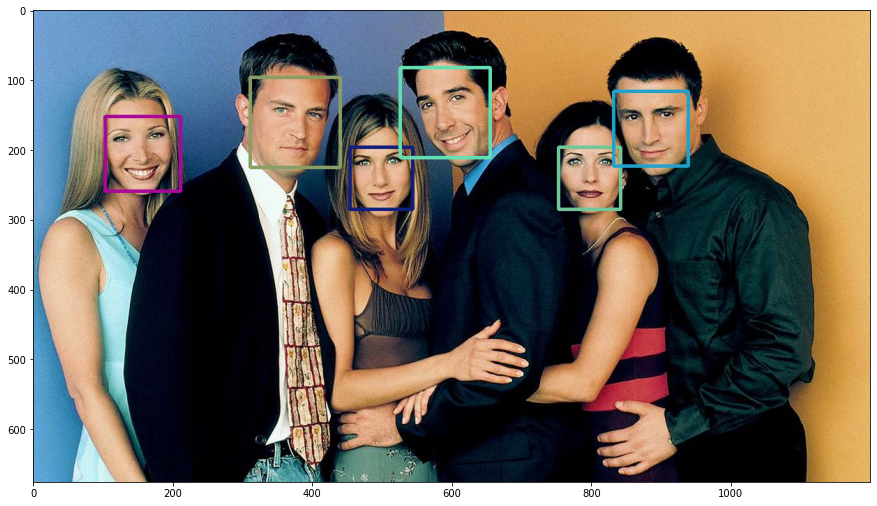

In [32]:
plt.imshow(output_imgs.get(friends).get('result_dlib'))

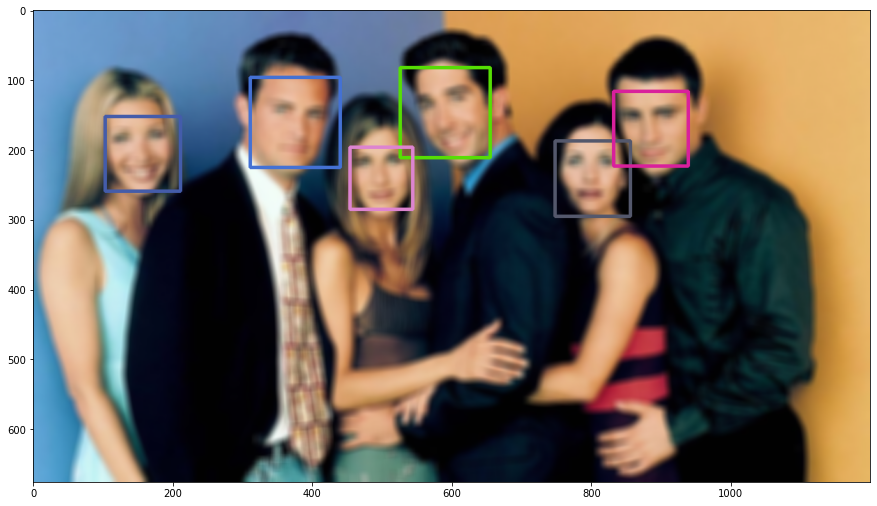

In [33]:
plt.imshow(output_imgs.get(friends).get('color_blurred'))

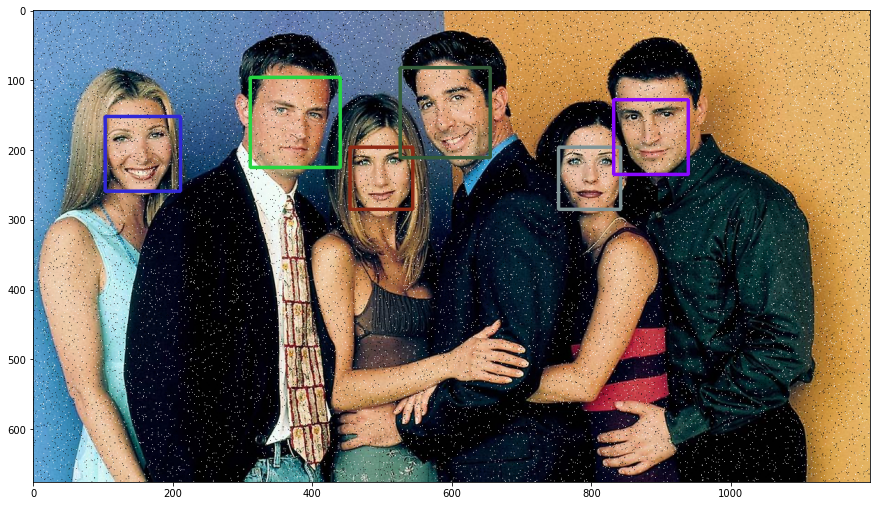

In [34]:
plt.imshow(output_imgs.get(friends).get('salt_pepper_noise'))

(<matplotlib.axes._subplots.AxesSubplot at 0x7efc3ca0cc10>,
 <matplotlib.image.AxesImage at 0x7efc3dfef7d0>)

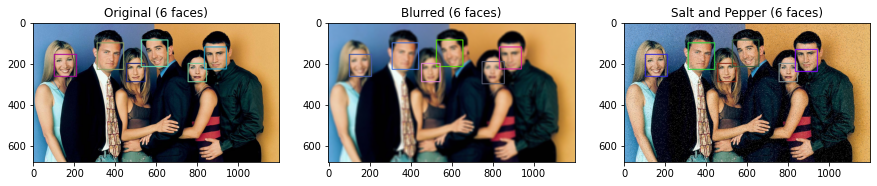

In [35]:
plt.subplot(131, title = "Original (6 faces)"), plt.imshow(output_imgs.get(friends).get('result_dlib'))
plt.subplot(132, title = "Blurred (6 faces)"), plt.imshow(output_imgs.get(friends).get('color_blurred'))
plt.subplot(133, title = "Salt and Pepper (6 faces)"), plt.imshow(output_imgs.get(friends).get('salt_pepper_noise'))

In [36]:
# dlib found all faces (color=6, grey=6, blurred=6, salt_and_pepper=6).
# picture has good resolution to obtain robust result.

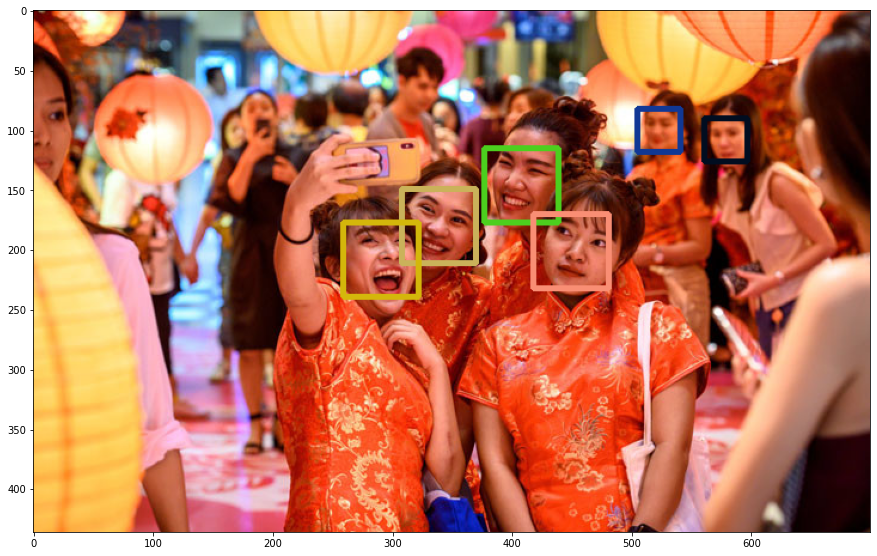

In [37]:
plt.imshow(output_imgs.get(china_leute).get('result_dlib'))

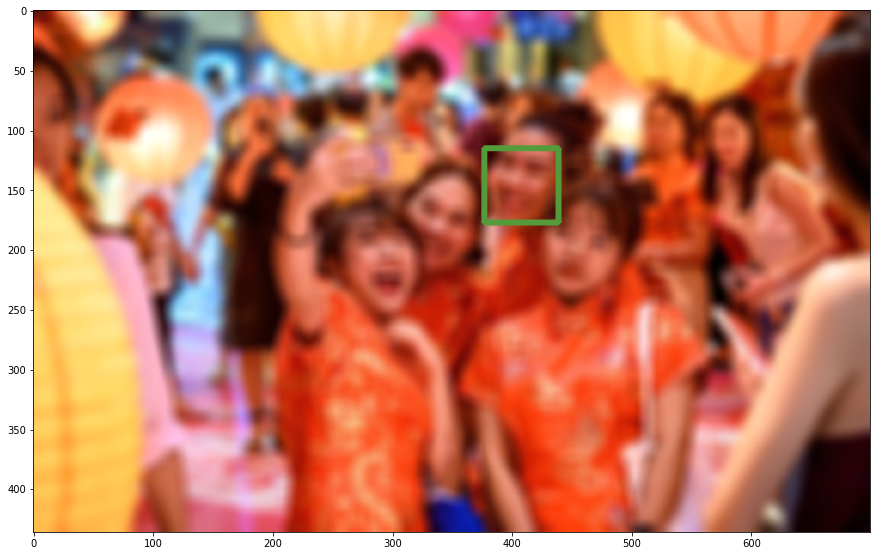

In [38]:
plt.imshow(output_imgs.get(china_leute).get('color_blurred'))

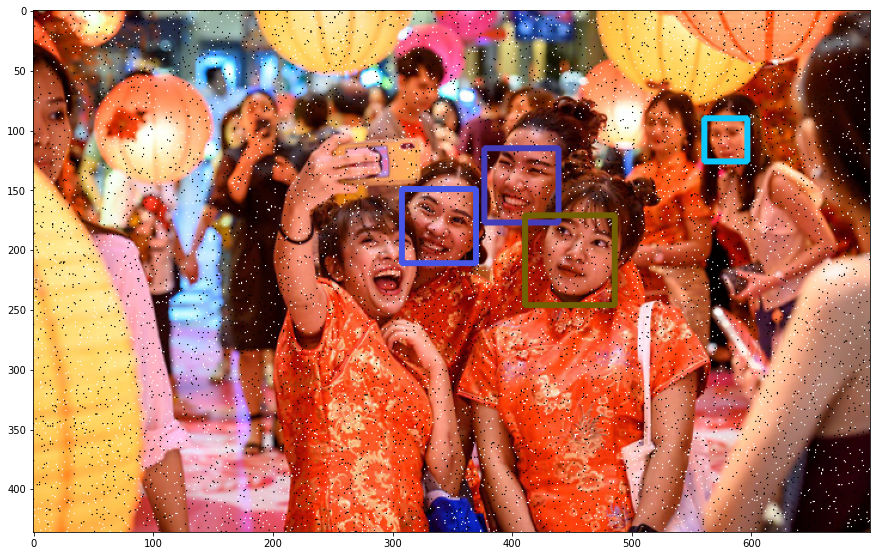

In [39]:
plt.imshow(output_imgs.get(china_leute).get('salt_pepper_noise'))

(<matplotlib.axes._subplots.AxesSubplot at 0x7efc3c652fd0>,
 <matplotlib.image.AxesImage at 0x7efc3c60ec90>)

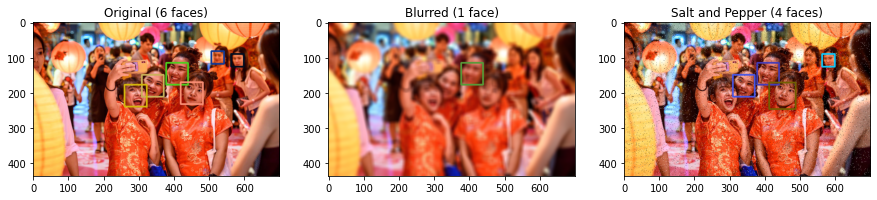

In [41]:
plt.subplot(131, title = "Original (6 faces)"), plt.imshow(output_imgs.get(china_leute).get('result_dlib'))
plt.subplot(132, title = "Blurred (1 face)"), plt.imshow(output_imgs.get(china_leute).get('color_blurred'))
plt.subplot(133, title = "Salt and Pepper (4 faces)"), plt.imshow(output_imgs.get(china_leute).get('salt_pepper_noise'))

In [ ]:
# dlib found all fronted faces, that had variance in depth. Photo was blurred with GaussianBlur with same ksize as "friends", but it has lower size.
# Faces are not really fronted. As result, blurred photo lost 5 faces.
# Noised with "salt-and-pepper" photo lost 2 faces.
# It is quite meaningful, that with adding noise we can destoy important features.

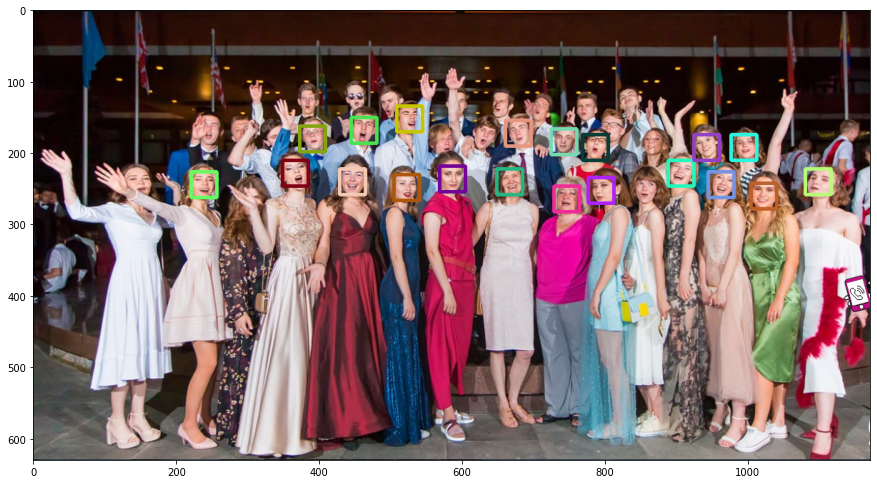

In [42]:
plt.imshow(output_imgs.get(alumni).get('result_dlib'))

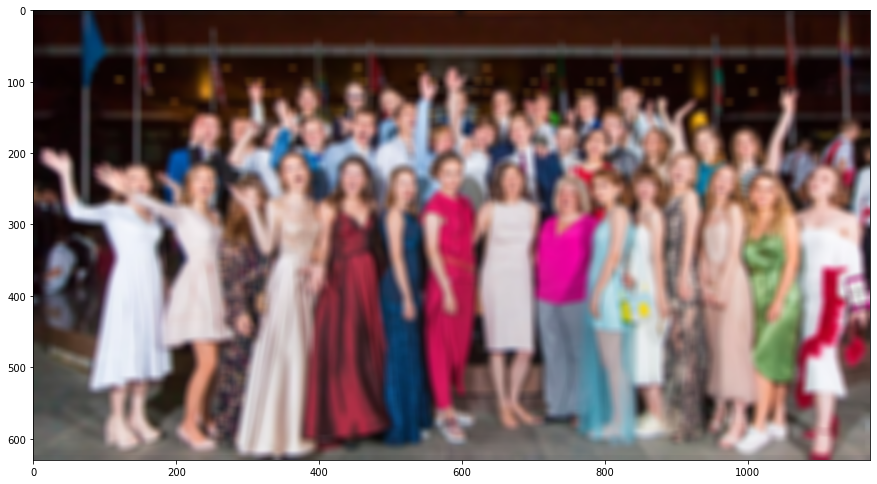

In [43]:
plt.imshow(output_imgs.get(alumni).get('color_blurred'))

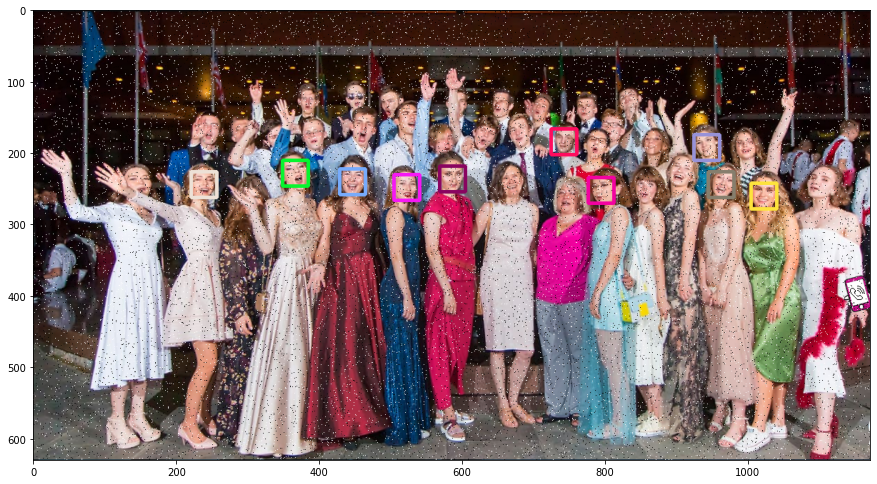

In [44]:
plt.imshow(output_imgs.get(alumni).get('salt_pepper_noise'))

(<matplotlib.axes._subplots.AxesSubplot at 0x7efc3c7d8490>,
 <matplotlib.image.AxesImage at 0x7efc3c54c850>)

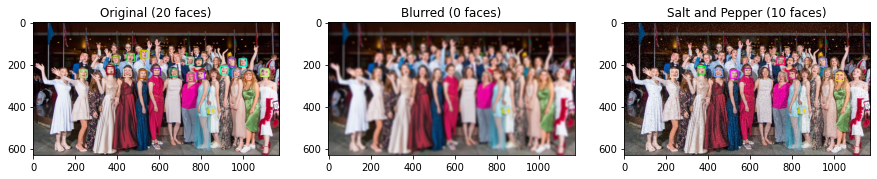

In [46]:
plt.subplot(131, title = "Original (20 faces)"), plt.imshow(output_imgs.get(alumni).get('result_dlib'))
plt.subplot(132, title = "Blurred (0 faces)"), plt.imshow(output_imgs.get(alumni).get('color_blurred'))
plt.subplot(133, title = "Salt and Pepper (10 faces)"), plt.imshow(output_imgs.get(alumni).get('salt_pepper_noise'))

In [ ]:
# "Alumni" picture has many faces, that are low-sized and have variance in depth.
# dlib has detected good all faces in first row,
# has got some success in second row and
# lost all faces in third row (they have the smallest size).
# blurring kills all high freq features and in combination with low size we have got 0 detected faces.
# Noised with "salt-and-pepper" photo lost 10 faces.

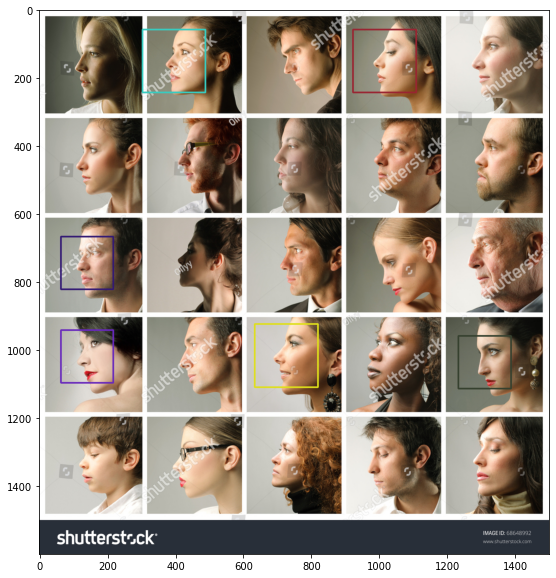

In [47]:
plt.imshow(output_imgs.get(profiles).get('result_dlib'))

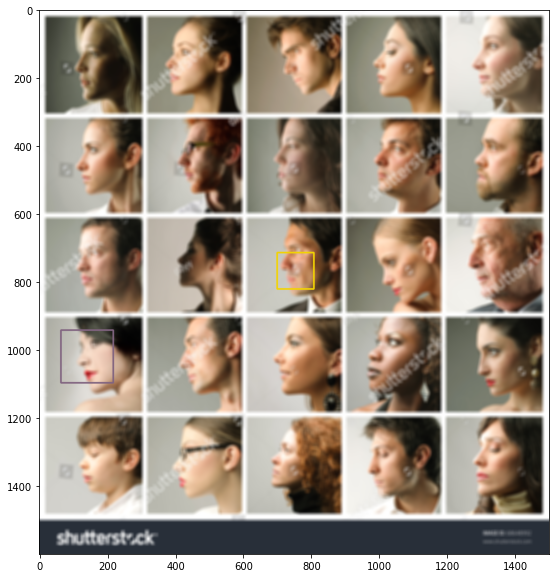

In [48]:
plt.imshow(output_imgs.get(profiles).get('color_blurred'))

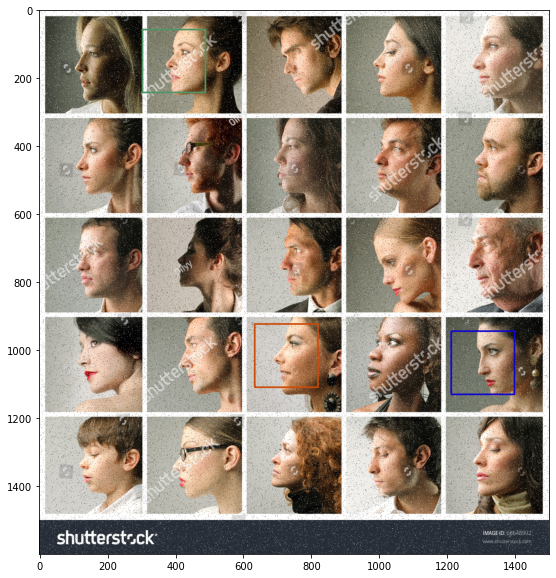

In [49]:
plt.imshow(output_imgs.get(profiles).get('salt_pepper_noise'))

(<matplotlib.axes._subplots.AxesSubplot at 0x7efc3c0bf190>,
 <matplotlib.image.AxesImage at 0x7efc3c07ef10>)

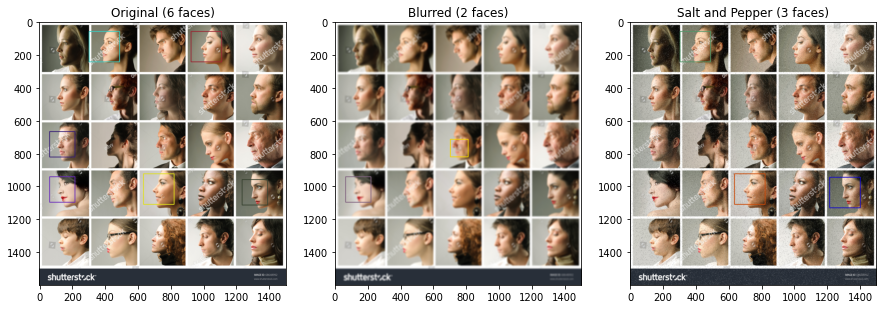

In [50]:
plt.subplot(131, title = "Original (6 faces)"), plt.imshow(output_imgs.get(profiles).get('result_dlib'))
plt.subplot(132, title = "Blurred (2 faces)"), plt.imshow(output_imgs.get(profiles).get('color_blurred'))
plt.subplot(133, title = "Salt and Pepper (3 faces)"), plt.imshow(output_imgs.get(profiles).get('salt_pepper_noise'))

In [ ]:
# Use "profiles" photo isn't the best idea for detector, that called "frontal_face_detector".
# Pic contains 25 faces, without noise and blurring dlib has detected 6.
# Blurring made situation worse, dlib has detected 2, but new one, that wasn't detected before (face in the middle).
# Noised with "salt-and-pepper" has 3 detected faces.
# As for me, result is not stable, but with better pic's quality and bigger size it can solve some tasks.

In [ ]:
# To get good face detection we need to get photo with good quality and resolution, e.g. "friends".
# It could be used filtering to suppress noise
# as it makes results worse.
# Note: "alumni" grey version photo has lower number of detected faces, so color makes also influence, when photo has low-sized faces.